## **Strength**
 It controls how similar the generated image is compared to given original image, for value=0 means its the same and value=1 gives a completely new image by ignoring the original image.

## **Guidance Scale**
 Controls how closely the genrated image is with the prompt. Higher value means more aligned with the prompt while lower values gives more space to the model to deviate from the prompt.






## **Relation between Strength and Guidance Scale:**
Combine a high strength + guidance_scale for maximum creativity or use a combination of low strength and low guidance_scale to generate an image that resembles the initial image but is not as strictly bound to the prompt.

## Clear GPU RAM

In [1]:
# to clear system and GPU RAM
for i in range(20):
  %reset -f
  import gc
  import torch
  torch.cuda.empty_cache()
  gc.collect()


In [ ]:
%reset -f

## Import Libraries

In [2]:
!pip install gradio

In [3]:
!pip install -q --upgrade diffusers invisible_watermark transformers accelerate safetensors
!pip install gradio

In [4]:
import gradio as gr
import os
import datetime
now = datetime.datetime.now()

In [5]:
import torch
# from diffusers import AutoPipelineForImage2Image
from diffusers import StableDiffusionXLImg2ImgPipeline
from diffusers.utils import make_image_grid, load_image


# Pipeline-1

In [6]:
# pipeline = AutoPipelineForImage2Image.from_pretrained(
#     "stabilityai/stable-diffusion-xl-refiner-1.0", torch_dtype=torch.float16, variant="fp16", use_safetensors=True
# )
pipeline=StableDiffusionXLImg2ImgPipeline.from_pretrained(
    "stabilityai/stable-diffusion-xl-refiner-1.0", torch_dtype=torch.float16, variant="fp16", use_safetensors=True
)
pipeline.enable_model_cpu_offload()
pipeline= pipeline.to("cuda")

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

It seems like you have activated model offloading by calling `enable_model_cpu_offload`, but are now manually moving the pipeline to GPU. It is strongly recommended against doing so as memory gains from offloading are likely to be lost. Offloading automatically takes care of moving the individual components vae, text_encoder, text_encoder_2, tokenizer, tokenizer_2, unet, image_encoder, feature_extractor, scheduler to GPU when needed. To make sure offloading works as expected, you should consider moving the pipeline back to CPU: `pipeline.to('cpu')` or removing the move altogether if you use offloading.


# Pipeline-2

In [10]:
pipeline2 = AutoPipelineForImage2Image.from_pretrained(
    "kandinsky-community/kandinsky-2-2-decoder", torch_dtype=torch.float16, use_safetensors=True
)
pipeline2.enable_model_cpu_offload()

NameError: name 'AutoPipelineForImage2Image' is not defined

# Pipeline-3

In [7]:
from diffusers import StableDiffusionImg2ImgPipeline, EulerDiscreteScheduler
from pathlib import Path
model_id = "stabilityai/stable-diffusion-2"
scheduler = EulerDiscreteScheduler.from_pretrained(
    model_id, subfolder="scheduler")
pipeline3 = StableDiffusionImg2ImgPipeline.from_pretrained(
    model_id, scheduler=scheduler, torch_dtype=torch.float16)
# pipe = pipe.to(device)
pipeline3 = pipeline3.to("cuda")

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1617: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be deprecated in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


# **T2**

Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

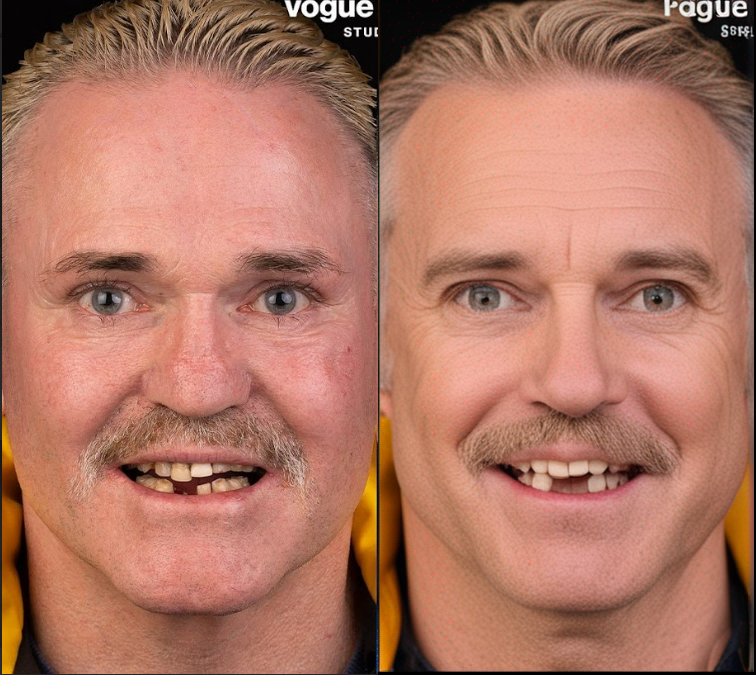

In [ ]:
import torch
from diffusers import AutoPipelineForImage2Image
from diffusers.utils import make_image_grid, load_image

pipeline = AutoPipelineForImage2Image.from_pretrained(
    "stabilityai/stable-diffusion-xl-refiner-1.0", torch_dtype=torch.float16, variant="fp16", use_safetensors=True
)
pipeline.enable_model_cpu_offload()
init_image = load_image('/content/before143.jpg')

# prompt = "Improve the smile structure of the person and keep the rest of face as it is"
# prompt="Person having a good smile structure with no visible teeth gaps and no missing teeths,human face,real"
# neg="[unrealistic],cartoonic,unreal,smooth skin"

prompt="Person having a good face structure,no visible teeth gaps+++ ,no missing teeths,white teeths++,teeth proportions in golden ratio,human face++,real+++.add missing teeths"
neg="[unrealistic],cartoonic,unreal,smooth skin,[deformed teeths],bad smile"
# pass prompt and image to pipeline
image = pipeline(prompt,negative_prompt=neg,image=init_image, strength=0.3).images[0]
make_image_grid([init_image, image], rows=1, cols=2)

# **T3**

Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

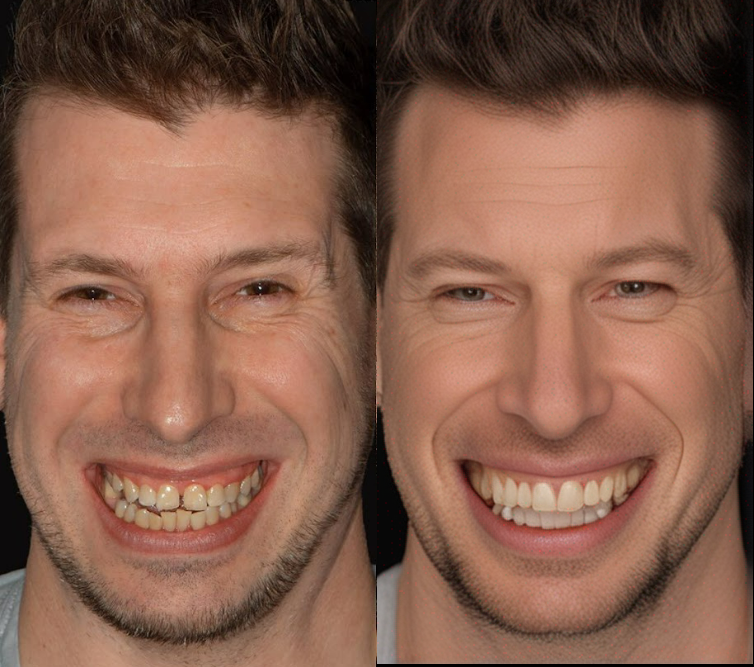

In [ ]:
import torch
from diffusers import AutoPipelineForImage2Image
from diffusers.utils import make_image_grid, load_image

pipeline = AutoPipelineForImage2Image.from_pretrained(
    "stabilityai/stable-diffusion-xl-refiner-1.0", torch_dtype=torch.float16, variant="fp16", use_safetensors=True
)
pipeline.enable_model_cpu_offload()
init_image = load_image('/content/before139.jpg')

# prompt = "Improve the smile structure of the person and keep the rest of face as it is"
prompt="Person having a good smile structure with no visible teeth gaps and no missing teeths,white teeths,golden ratio,human face,real"
neg="[unrealistic],cartoonic,unreal,smooth skin,[deformed teeths],bad smile"
# pass prompt and image to pipeline
image = pipeline(prompt,negative_prompt=neg,image=init_image, strength=0.3).images[0]
make_image_grid([init_image, image], rows=1, cols=2)

# **T4**

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:88: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

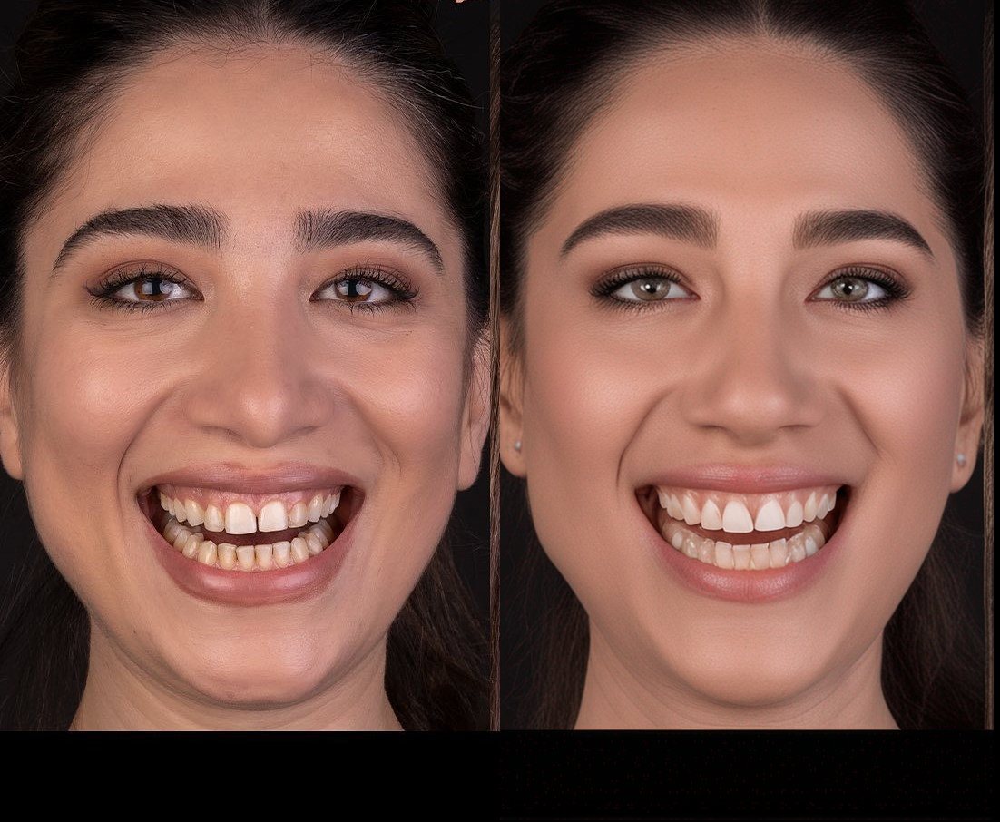

In [ ]:
import torch
from diffusers import AutoPipelineForImage2Image
from diffusers.utils import make_image_grid, load_image
# from compel import Compel

# compel_proc = Compel(tokenizer=pipe.tokenizer, text_encoder=pipe.text_encoder)
pipeline = AutoPipelineForImage2Image.from_pretrained(
    "stabilityai/stable-diffusion-xl-refiner-1.0", torch_dtype=torch.float16, variant="fp16", use_safetensors=True
)
pipeline.enable_model_cpu_offload()
init_image = load_image('/content/before48.jpg')
# init_image = transforms.ToTensor()(init_image).to(device)

# prompt = "Improve the smile structure of the person and keep the rest of face as it is"
prompt="Person having a good face structure,no visible teeth gaps+++ ,no missing teeths,white teeths++,teeth proportions in golden ratio,human face++,real+++"
neg="[unrealistic],cartoonic,unreal,smooth skin,[deformed teeths],bad smile"
# pass prompt and image to pipeline
image = pipeline(prompt,negative_prompt=neg,image=init_image, strength=0.2).images[0]
# prompt_embeds = compel_proc(prompt)
# image = pipeline(prompt_embeds,negative_prompt=neg,image=init_image, strength=0.2).images[0]
make_image_grid([init_image, image], rows=1, cols=2)

# **T5**

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:88: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

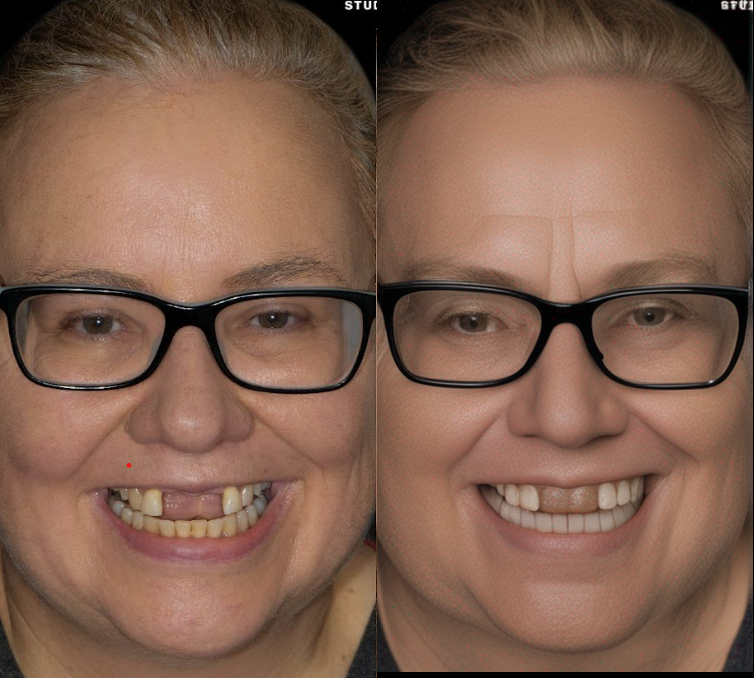

In [ ]:
import torch
from diffusers import AutoPipelineForImage2Image
from diffusers.utils import make_image_grid, load_image
# from compel import Compel

# compel_proc = Compel(tokenizer=pipe.tokenizer, text_encoder=pipe.text_encoder)
pipeline = AutoPipelineForImage2Image.from_pretrained(
    "stabilityai/stable-diffusion-xl-refiner-1.0", torch_dtype=torch.float16, variant="fp16", use_safetensors=True
)
pipeline.enable_model_cpu_offload()
init_image = load_image('/content/before145.jpg')
# init_image = transforms.ToTensor()(init_image).to(device)

# prompt = "Improve the smile structure of the person and keep the rest of face as it is"
prompt="Person having a good face structure,no visible teeth gaps+++ ,no missing teeths,white teeths++,teeth proportions in golden ratio,human face++,real+++"
neg="[unrealistic],cartoonic,unreal,smooth skin,[deformed teeths],bad smile,missing teeths,visible gums"
# pass prompt and image to pipeline
image = pipeline(prompt,negative_prompt=neg,image=init_image, strength=0.2).images[0]
# prompt_embeds = compel_proc(prompt)
# image = pipeline(prompt_embeds,negative_prompt=neg,image=init_image, strength=0.2).images[0]
make_image_grid([init_image, image], rows=1, cols=2)

# **T6**

Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

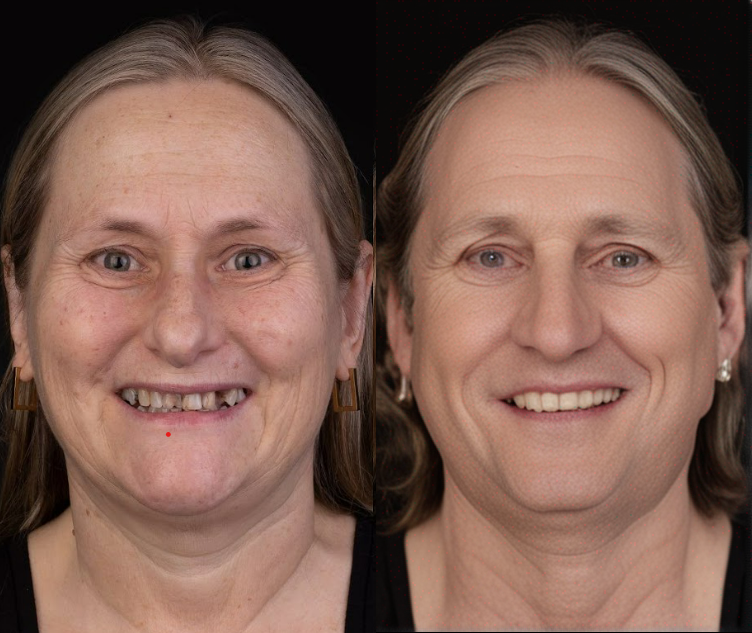

In [ ]:
import torch
from diffusers import AutoPipelineForImage2Image
from diffusers.utils import make_image_grid, load_image
# from compel import Compel

# compel_proc = Compel(tokenizer=pipe.tokenizer, text_encoder=pipe.text_encoder)
pipeline = AutoPipelineForImage2Image.from_pretrained(
    "stabilityai/stable-diffusion-xl-refiner-1.0", torch_dtype=torch.float16, variant="fp16", use_safetensors=True
)
pipeline.enable_model_cpu_offload()
init_image = load_image('/content/before146.jpg')
# init_image = transforms.ToTensor()(init_image).to(device)

# prompt = "Improve the smile structure of the person and keep the rest of face as it is"
prompt="Person having a good face structure,no visible teeth gaps ,no missing teeths,white teeths,Shining teeth,Ivory teeth,teeth proportions in golden ratio,natural face,human face,realistic"
neg="[unrealistic],cartoonic,unreal,smooth skin,[deformed teeths],bad smile,missing teeths,visible gums"
# pass prompt and image to pipeline
image = pipeline(prompt,negative_prompt=neg,image=init_image, strength=0.3).images[0]
# prompt_embeds = compel_proc(prompt)
# image = pipeline(prompt_embeds,negative_prompt=neg,image=init_image, strength=0.2).images[0]
make_image_grid([init_image, image], rows=1, cols=2)

# **T7**

Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

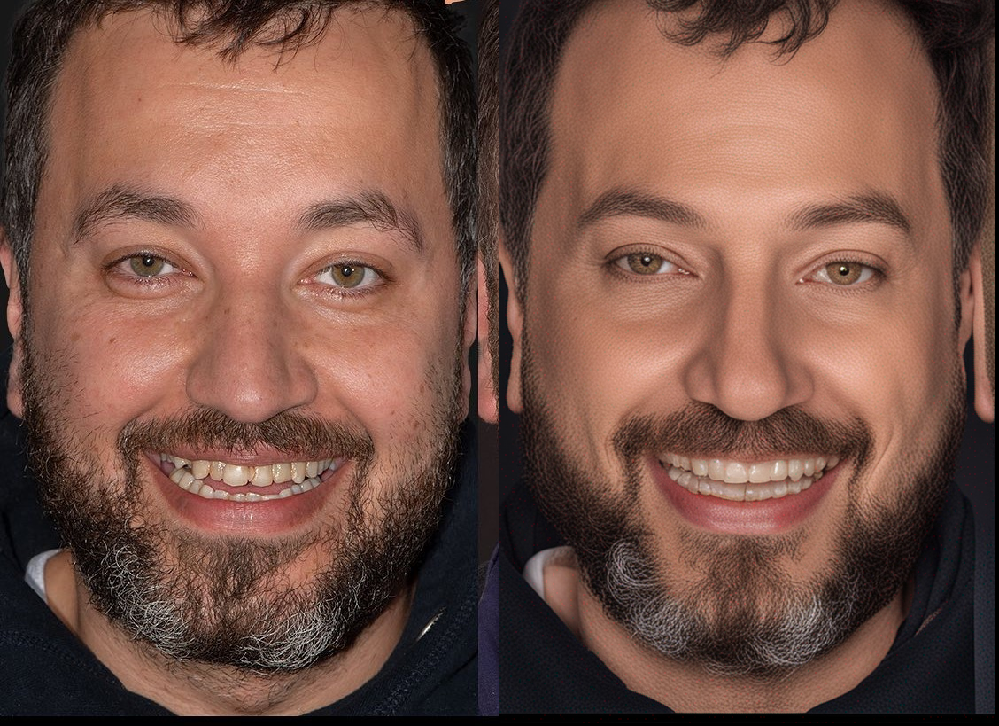

In [ ]:
import torch
from diffusers import AutoPipelineForImage2Image
from diffusers.utils import make_image_grid, load_image

pipeline = AutoPipelineForImage2Image.from_pretrained(
    "stabilityai/stable-diffusion-xl-refiner-1.0", torch_dtype=torch.float16, variant="fp16", use_safetensors=True
)
pipeline.enable_model_cpu_offload()


init_image = load_image('/content/before44.jpg')

prompt="Person having a good face structure,no visible teeth gaps ,no missing teeths,white teeths,Shining teeth,Ivory teeth,teeth proportions in golden ratio,natural face,human face,real"
neg="[unrealistic],cartoonic,unreal,smooth skin,[deformed teeths],bad smile,missing teeths,visible gums"

prompt_strength=0.2
gs_scale=8

image = pipeline(prompt,negative_prompt=neg,image=init_image, strength=prompt_strength,guidance_scale=gs_scale).images[0]


make_image_grid([init_image, image], rows=1, cols=2)

# **T8**

Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

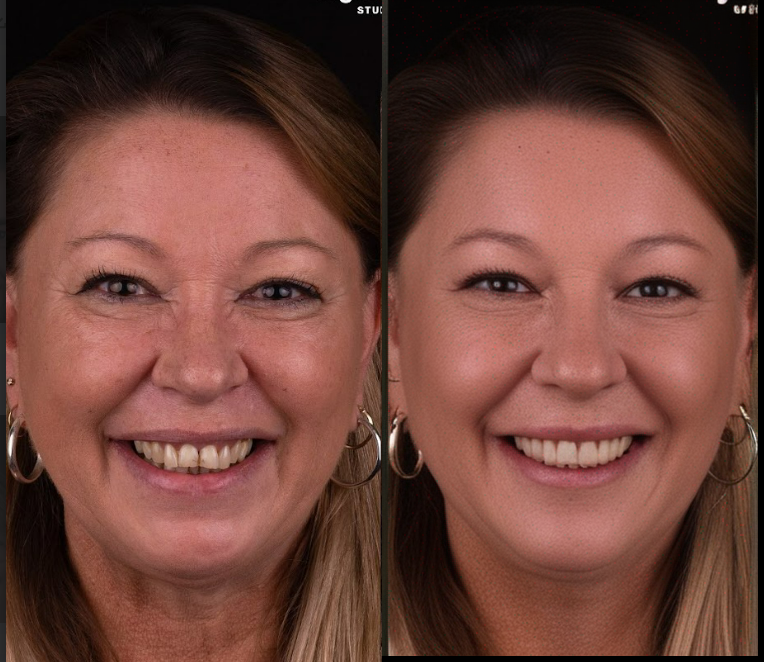

In [ ]:
import torch
from diffusers import AutoPipelineForImage2Image
from diffusers.utils import make_image_grid, load_image

pipeline = AutoPipelineForImage2Image.from_pretrained(
    "stabilityai/stable-diffusion-xl-refiner-1.0", torch_dtype=torch.float16, variant="fp16", use_safetensors=True
)
pipeline.enable_model_cpu_offload()


init_image = load_image('/content/before108.jpg')

prompt="Person having a good face structure,no visible teeth gaps ,no missing teeths,white teeths,Shining teeth,Ivory teeth,teeth proportions in golden ratio,natural face,human face,real"
neg="[unrealistic],cartoonic,unreal,smooth skin,[deformed teeths],bad smile,missing teeths,visible gums"

prompt_strength=0.1
gs_scale=3

image = pipeline(prompt,negative_prompt=neg,image=init_image, strength=prompt_strength,guidance_scale=gs_scale).images[0]


make_image_grid([init_image, image], rows=1, cols=2)

# **T9**

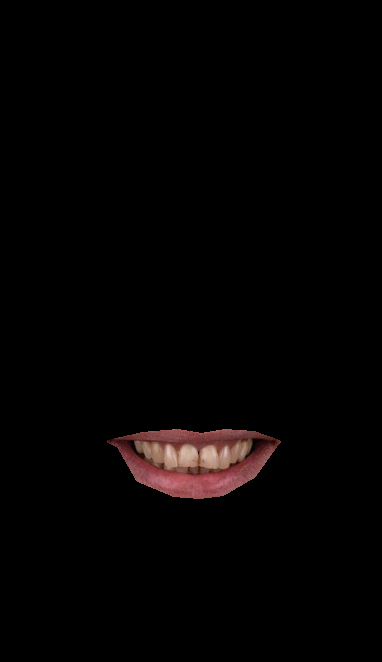

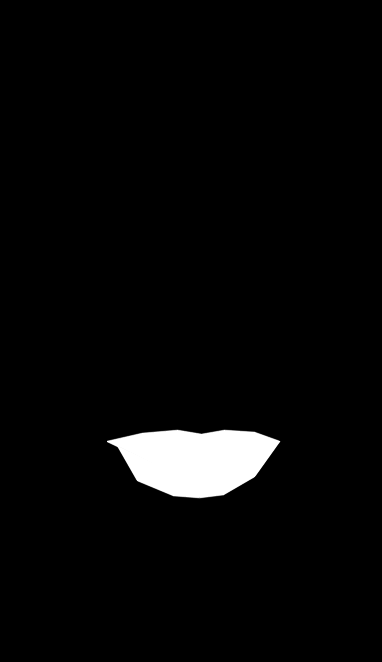

True

In [ ]:
import cv2
from google.colab.patches import cv2_imshow
import numpy as np
import dlib
from urllib.request import urlretrieve
import matplotlib.pyplot as plt
# Download the shape predictor file
url = 'http://dlib.net/files/shape_predictor_68_face_landmarks.dat.bz2'
urlretrieve(url, 'shape_predictor_68_face_landmarks.dat.bz2')

# Extract the file
!bzip2 -dk shape_predictor_68_face_landmarks.dat.bz2


img = cv2.imread('before108.jpg')
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Load the face detector and facial landmarks predictor from dlib
detector = dlib.get_frontal_face_detector()
predictor = dlib.shape_predictor('shape_predictor_68_face_landmarks.dat')

faces = detector(gray)
mask = np.zeros_like(gray)

for face in faces:
    # Get the landmarks for the face
    landmarks = predictor(gray, face)

    # Extract mouth and teeth region using landmarks
    mouth_points = [landmarks.part(i) for i in range(48, 68)]
    teeth_points = [landmarks.part(i) for i in range(60, 68)]
    all_points = mouth_points + teeth_points

    points = np.array([(point.x, point.y) for point in all_points], np.int32)
    points = points.reshape((-1, 1, 2))

    # Draw the filled polygon on the mask
    cv2.fillPoly(mask, [points], color=(255, 255, 255), lineType=cv2.LINE_AA)

result = cv2.bitwise_and(img, img, mask=mask)

cv2_imshow(result)
print()
cv2_imshow(mask)
cv2.imwrite('mask108.jpg',mask)

Loading pipeline components...:   0%|          | 0/3 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

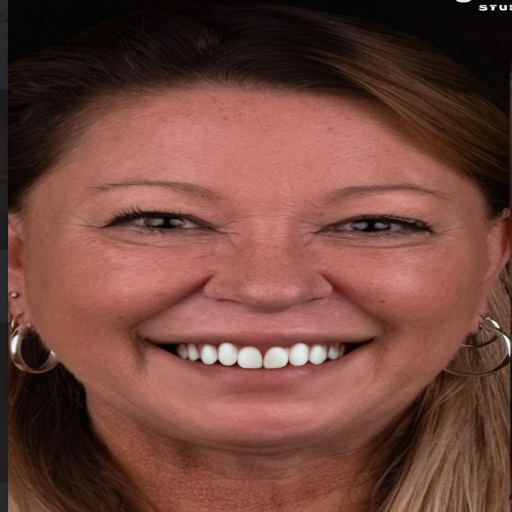

In [ ]:
import torch
from diffusers import AutoPipelineForImage2Image
from diffusers.utils import make_image_grid, load_image
from diffusers import AutoPipelineForInpainting
# pipeline = AutoPipelineForImage2Image.from_pretrained(
#     "diffusers/stable-diffusion-xl-1.0-inpainting-0.1", torch_dtype=torch.float16, variant="fp16", use_safetensors=True
# )
# pipeline = AutoPipelineForImage2Image.from_pretrained(
#     "stabilityai/stable-diffusion-xl-refiner-1.0", torch_dtype=torch.float16, variant="fp16", use_safetensors=True
# )
pipeline = AutoPipelineForInpainting.from_pretrained(
    "kandinsky-community/kandinsky-2-2-decoder-inpaint", torch_dtype=torch.float16
)
pipeline.enable_model_cpu_offload()


init_image = load_image('/content/before108.jpg')
mask_image = load_image('/content/mask108.jpg')
prompt="Person having a good face structure,no visible teeth gaps ,no missing teeths,white teeths,Shining teeth,Ivory teeth,teeth proportions in golden ratio,natural face,human face,real"
neg="[unrealistic],cartoonic,unreal,smooth skin,[deformed teeths],bad smile,missing teeths,visible gums"

prompt_strength=0.3
gs_scale=3
generator = torch.Generator("cuda").manual_seed(92)
image = pipeline(prompt=prompt, image=init_image, mask_image=mask_image).images[0]

# make_image_grid([init_image, image], rows=1, cols=2)
image

In [ ]:
import torch
from diffusers import  ControlNetModel  # Assuming a compatible ControlNet implementation
from diffusers import AutoPipelineForImage2Image
from diffusers.utils import make_image_grid, load_image
from diffusers import AutoPipelineForInpainting
pipeline = AutoPipelineForImage2Image.from_pretrained(
    "diffusers/stable-diffusion-xl-1.0-inpainting-0.1", torch_dtype=torch.float16, variant="fp16", use_safetensors=True
)
# pipeline = AutoPipelineForImage2Image.from_pretrained(
#     "stabilityai/stable-diffusion-xl-refiner-1.0", torch_dtype=torch.float16, variant="fp16", use_safetensors=True
# )
# pipeline = AutoPipelineForInpainting.from_pretrained(
#     "kandinsky-community/kandinsky-2-2-decoder-inpaint", torch_dtype=torch.float16
# )
pipeline.enable_model_cpu_offload()


init_image = load_image('/content/before108.jpg')
mask_image = load_image('/content/mask108.jpg')
prompt="Person having a good face structure,no visible teeth gaps ,no missing teeths,white teeths,Shining teeth,Ivory teeth,teeth proportions in golden ratio,natural face,human face,real"
neg="[unrealistic],cartoonic,unreal,smooth skin,[deformed teeths],bad smile,missing teeths,visible gums"

prompt_strength=0.3
gs_scale=3


generator = torch.Generator("cuda").manual_seed(92)
control_net= ControlNetModel.from_pretrained("lllyasviel/control_v11p_sd15_inpaint")

# image = pipeline(prompt=prompt, image=init_image, mask_image=mask_image).images[0]
image = pipeline(
    prompt=prompt,
    image=init_image,
    mask_image=mask_image,
    control_net=control_net  # Pass the loaded ControlNet
).images[0]

# make_image_grid([init_image, image], rows=1, cols=2)
image

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

The config attributes {'decay': 0.9999, 'inv_gamma': 1.0, 'min_decay': 0.0, 'optimization_step': 37000, 'power': 0.6666666666666666, 'update_after_step': 0, 'use_ema_warmup': False} were passed to UNet2DConditionModel, but are not expected and will be ignored. Please verify your config.json configuration file.


  0%|          | 0/15 [00:00<?, ?it/s]

RuntimeError: Given groups=1, weight of size [320, 9, 3, 3], expected input[2, 4, 82, 47] to have 9 channels, but got 4 channels instead

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

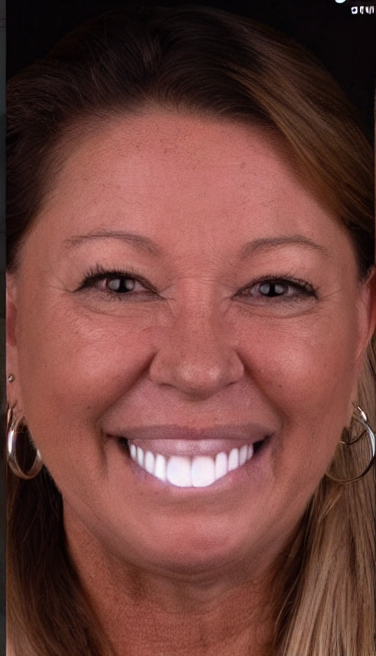

In [ ]:
# !pip install transformers accelerate
from diffusers import StableDiffusionControlNetInpaintPipeline, ControlNetModel
from diffusers.utils import load_image
import numpy as np
import torch

init_image = load_image(
    "/content/before108.jpg"
)
# init_image = init_image.resize((512, 512))

generator = torch.Generator(device="cpu").manual_seed(3)

mask_image = load_image(
    "/content/mask108.jpg"
)
# mask_image = mask_image.resize((512, 512))


def make_inpaint_condition(image, image_mask):
    image = np.array(image.convert("RGB")).astype(np.float32) / 255.0
    image_mask = np.array(image_mask.convert("L")).astype(np.float32) / 255.0

    assert image.shape[0:1] == image_mask.shape[0:1], "image and image_mask must have the same image size"
    image[image_mask > 0.5] = -1.0  # set as masked pixel
    image = np.expand_dims(image, 0).transpose(0, 3, 1, 2)
    image = torch.from_numpy(image)
    return image


control_image = make_inpaint_condition(init_image, mask_image)

controlnet = ControlNetModel.from_pretrained(
    "lllyasviel/control_v11p_sd15_inpaint", torch_dtype=torch.float16
)
pipe = StableDiffusionControlNetInpaintPipeline.from_pretrained(
    "runwayml/stable-diffusion-v1-5", controlnet=controlnet, torch_dtype=torch.float16
)

# pipe.scheduler = DDIMScheduler.from_config(pipe.scheduler.config)
pipe.enable_model_cpu_offload()

# generate image
image = pipe(
    "Good Smile with natural teeths and no visible gaps",
    num_inference_steps=20,
    generator=generator,
    eta=1.0,
    image=init_image,
    mask_image=mask_image,
    control_image=control_image,
).images[0]
image

# **T10**

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:88: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

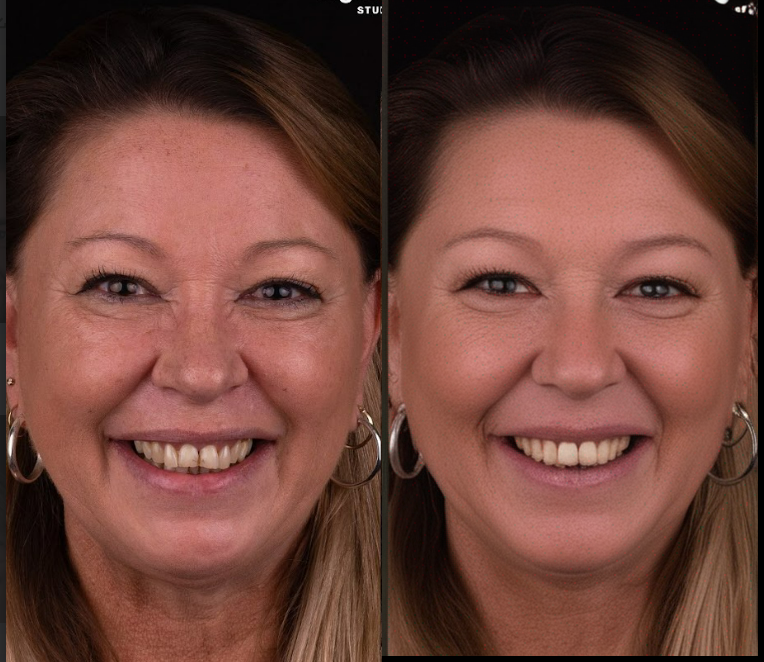

In [ ]:
import torch
from diffusers import AutoPipelineForImage2Image
from diffusers.utils import make_image_grid, load_image

pipeline = AutoPipelineForImage2Image.from_pretrained(
    "stabilityai/stable-diffusion-xl-refiner-1.0", torch_dtype=torch.float16, variant="fp16", use_safetensors=True
)
pipeline.enable_model_cpu_offload()


init_image = load_image('/content/before108.jpg')

prompt="Person having a good face structure,no visible teeth gaps ,no missing teeths,white teeths,natural face,human face,realistic,sharp focus"
neg="[unrealistic],cartoonic,unreal,smooth skin,[deformed teeths],bad smile,missing teeths,visible gums"

prompt_strength=0.1
gs_scale=3
num_images=3

image = pipeline(prompt,negative_prompt=neg,image=init_image, strength=prompt_strength,guidance_scale=gs_scale,num_images_per_prompt=num_images).images[0]

make_image_grid([init_image, image], rows=1, cols=2)

# **T11**

  0%|          | 0/5 [00:00<?, ?it/s]

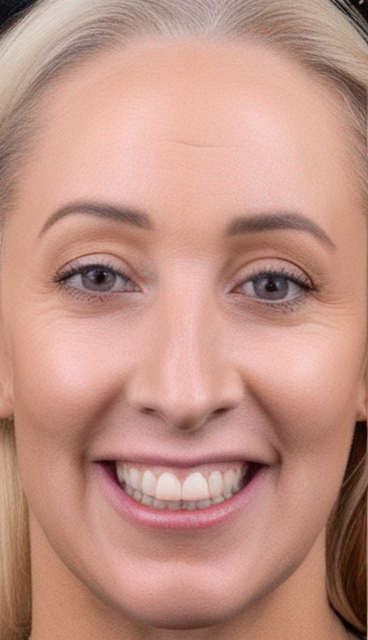

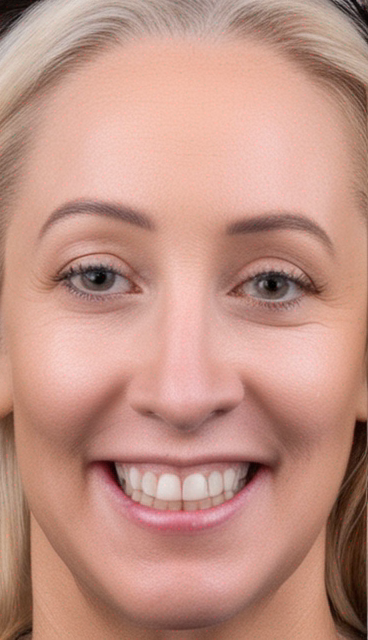

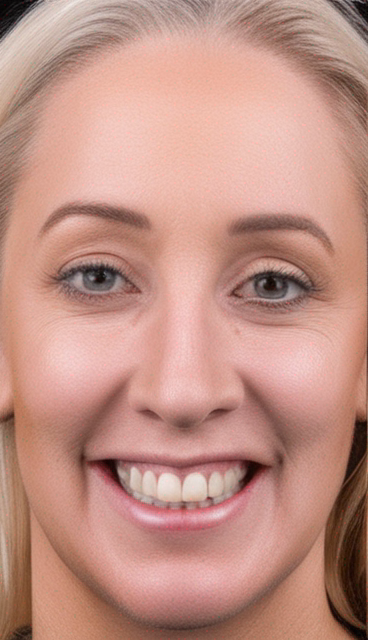

In [ ]:
init_image = load_image('/content/before144.jpg')

prompt="Person having a good face structure,no visible teeth gaps ,no missing teeths,white teeths,natural face,human face,realistic,sharp focus"
neg="[unrealistic],cartoonic,unreal,smooth skin,[deformed teeths],bad smile,missing teeths,visible gums"

prompt_strength=0.1
gs_scale=3
num_images=3

steps=50
image = pipeline(prompt,negative_prompt=neg,image=init_image,  num_inference_steps=steps,strength=prompt_strength,guidance_scale=gs_scale,num_images_per_prompt=num_images).images

# print(type(image))
# make_image_grid([init_image, image], rows=1, cols=2)

for i in range(num_images):
  display(image[i])

# T12

  0%|          | 0/1 [00:00<?, ?it/s]

<class 'list'>


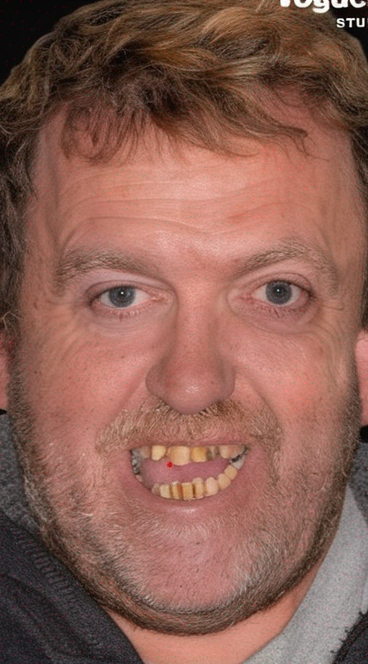

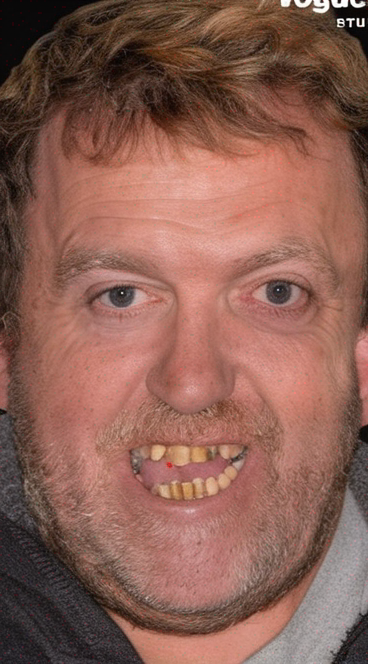

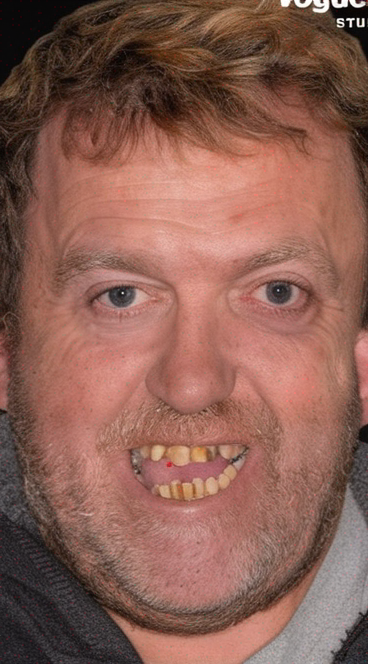

In [ ]:
init_image = load_image('/content/before147.jpg')

prompt="Person having a good face structure,no visible teeth gaps ,no missing teeths,(white teeths:2),natural face,human face,realistic,sharp focus"
neg="[unrealistic],cartoonic,unreal,smooth skin,[deformed teeths],bad smile,missing teeths,visible gums"

prompt_strength=0.1
gs_scale=3
num_images=3
steps=10
image = pipeline(prompt,negative_prompt=neg,image=init_image,num_inference_steps=steps,strength=prompt_strength,guidance_scale=gs_scale,num_images_per_prompt=num_images).images
print(type(image))
# make_image_grid([init_image, image], rows=1, cols=2)
for i in range(num_images):
  display(image[i])

# T13

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

<class 'list'>


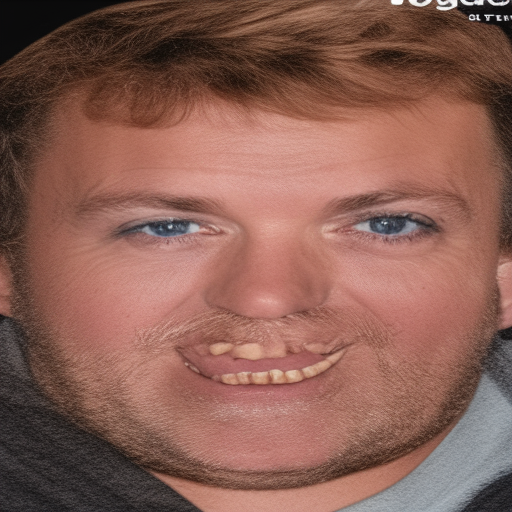

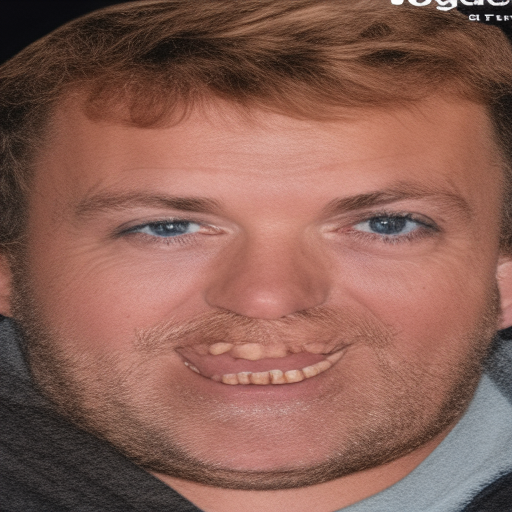

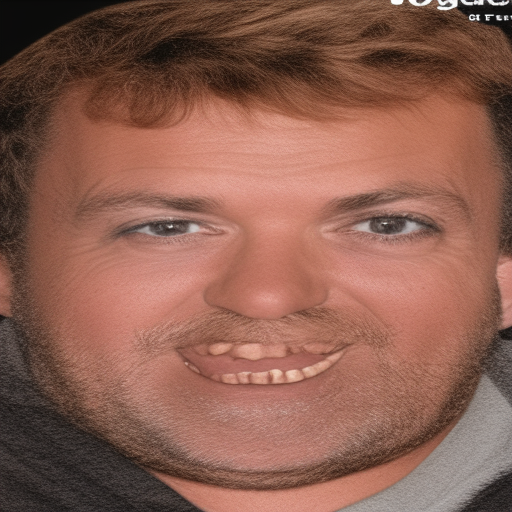

In [ ]:
init_image = load_image('/content/before147.jpg')

prompt="Person having a good face structure,no visible teeth gaps ,no missing teeths,(white teeths:2),natural face,human face,realistic,sharp focus"
neg="[unrealistic],cartoonic,unreal,smooth skin,[deformed teeths],bad smile,missing teeths,visible gums"

prompt_strength=0.1
gs_scale=3
num_images=3
steps=20
image = pipeline(prompt,negative_prompt=neg,image=init_image,num_inference_steps=steps,strength=prompt_strength,guidance_scale=gs_scale,num_images_per_prompt=num_images).images
print(type(image))
# make_image_grid([init_image, image], rows=1, cols=2)
for i in range(num_images):
  display(image[i])

# T14

bzip2: Output file shape_predictor_68_face_landmarks.dat already exists.


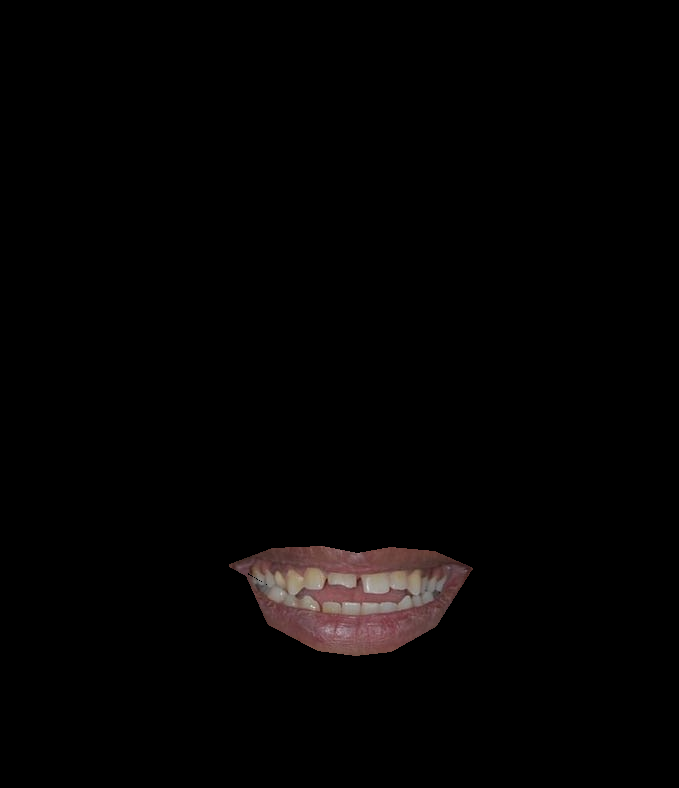

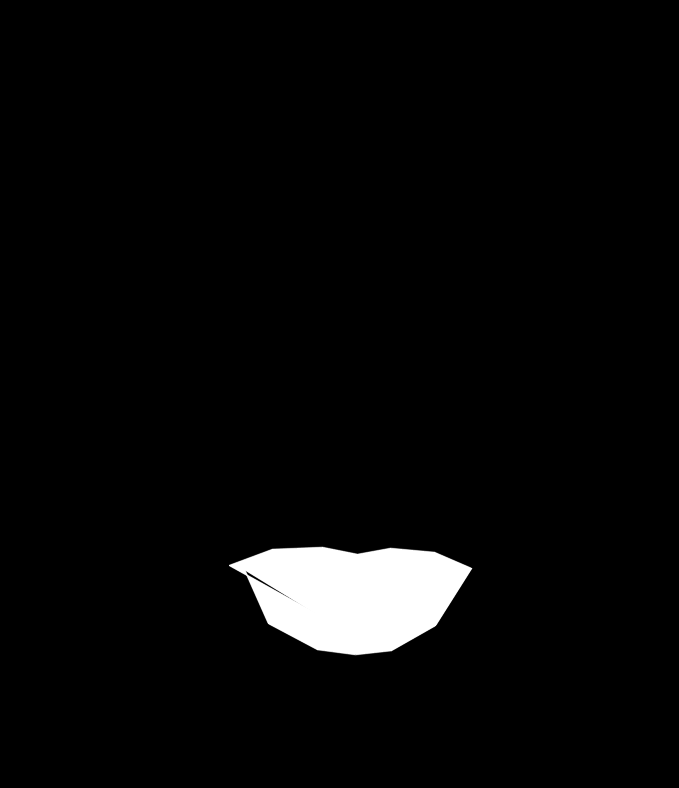

True

In [ ]:
import cv2
from google.colab.patches import cv2_imshow
import numpy as np
import dlib
from urllib.request import urlretrieve
import matplotlib.pyplot as plt
# Download the shape predictor file
url = 'http://dlib.net/files/shape_predictor_68_face_landmarks.dat.bz2'
urlretrieve(url, 'shape_predictor_68_face_landmarks.dat.bz2')

# Extract the file
!bzip2 -dk shape_predictor_68_face_landmarks.dat.bz2


img = cv2.imread('before8.jpg')
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Load the face detector and facial landmarks predictor from dlib
detector = dlib.get_frontal_face_detector()
predictor = dlib.shape_predictor('shape_predictor_68_face_landmarks.dat')

faces = detector(gray)
mask = np.zeros_like(gray)

for face in faces:
    # Get the landmarks for the face
    landmarks = predictor(gray, face)

    # Extract mouth and teeth region using landmarks
    mouth_points = [landmarks.part(i) for i in range(48, 68)]
    teeth_points = [landmarks.part(i) for i in range(60, 68)]
    all_points = mouth_points + teeth_points

    points = np.array([(point.x, point.y) for point in all_points], np.int32)
    points = points.reshape((-1, 1, 2))

    # Draw the filled polygon on the mask
    cv2.fillPoly(mask, [points], color=(255, 255, 255), lineType=cv2.LINE_AA)

result = cv2.bitwise_and(img, img, mask=mask)

cv2_imshow(result)
print()
cv2_imshow(mask)
cv2.imwrite('mask8.jpg',mask)

Loading pipeline components...:   0%|          | 0/3 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

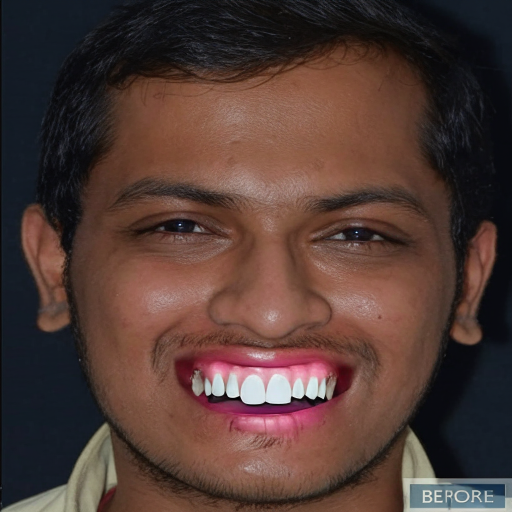

In [ ]:
import torch
from diffusers import AutoPipelineForImage2Image
from diffusers.utils import make_image_grid, load_image
from diffusers import AutoPipelineForInpainting
# pipeline = AutoPipelineForImage2Image.from_pretrained(
#     "diffusers/stable-diffusion-xl-1.0-inpainting-0.1", torch_dtype=torch.float16, variant="fp16", use_safetensors=True
# )
# pipeline = AutoPipelineForImage2Image.from_pretrained(
#     "stabilityai/stable-diffusion-xl-refiner-1.0", torch_dtype=torch.float16, variant="fp16", use_safetensors=True
# )
pipeline = AutoPipelineForInpainting.from_pretrained(
    "kandinsky-community/kandinsky-2-2-decoder-inpaint", torch_dtype=torch.float16
)
pipeline.enable_model_cpu_offload()


init_image = load_image('/content/before8.jpg')
mask_image = load_image('/content/mask8.jpg')
prompt="no visible teeth gaps ,no missing teeths,white teeths,teeth proportions in golden ratio,natural face,human face,real,only fill one missing half teeth in middle, lower and upper jaws should be vissible,No lips change"
neg="[unrealistic],cartoonic,unreal,smooth skin,[deformed teeths],bad smile,missing teeths,visible gums"

prompt_strength=0.3
gs_scale=3
generator = torch.Generator("cuda").manual_seed(92)
image = pipeline(prompt=prompt, image=init_image, mask_image=mask_image).images[0]

# make_image_grid([init_image, image], rows=1, cols=2)
image

# T15

bzip2: Output file shape_predictor_68_face_landmarks.dat already exists.


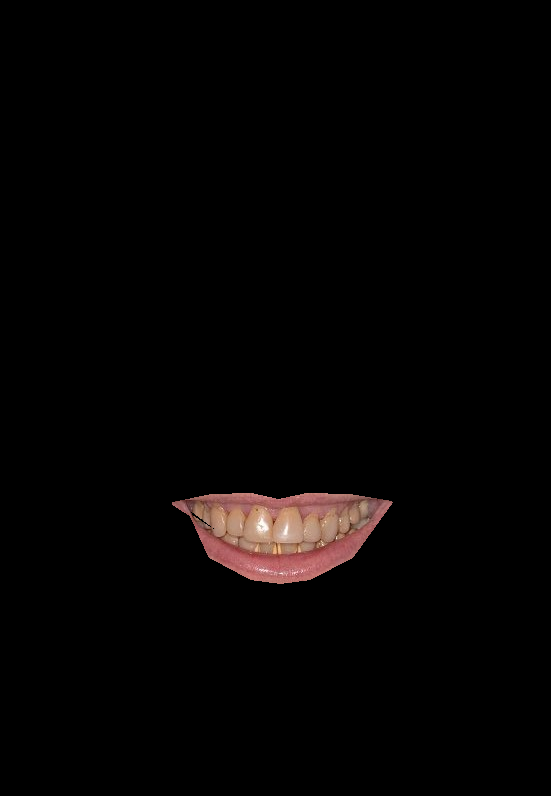

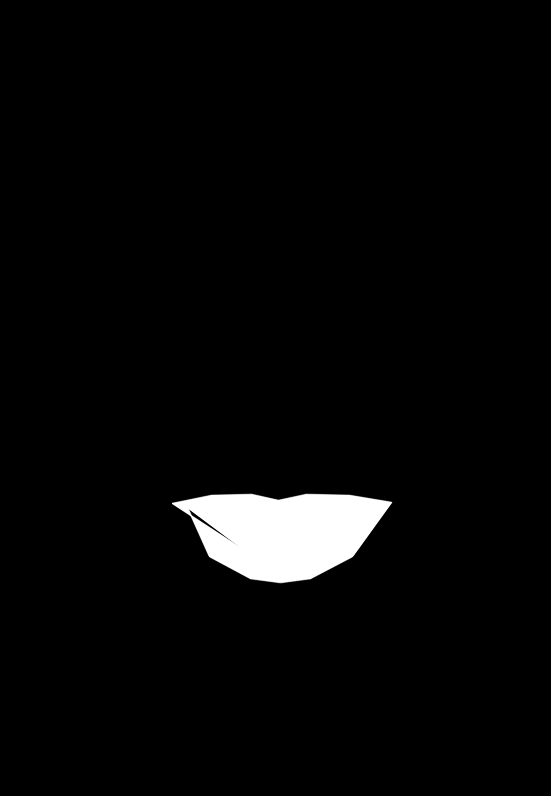

True

In [ ]:
import cv2
from google.colab.patches import cv2_imshow
import numpy as np
import dlib
from urllib.request import urlretrieve
import matplotlib.pyplot as plt
# Download the shape predictor file
url = 'http://dlib.net/files/shape_predictor_68_face_landmarks.dat.bz2'
urlretrieve(url, 'shape_predictor_68_face_landmarks.dat.bz2')

# Extract the file
!bzip2 -dk shape_predictor_68_face_landmarks.dat.bz2


img = cv2.imread('before98.jpg')
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Load the face detector and facial landmarks predictor from dlib
detector = dlib.get_frontal_face_detector()
predictor = dlib.shape_predictor('shape_predictor_68_face_landmarks.dat')

faces = detector(gray)
mask = np.zeros_like(gray)

for face in faces:
    # Get the landmarks for the face
    landmarks = predictor(gray, face)

    # Extract mouth and teeth region using landmarks
    mouth_points = [landmarks.part(i) for i in range(48, 68)]
    teeth_points = [landmarks.part(i) for i in range(60, 68)]
    all_points = mouth_points + teeth_points

    points = np.array([(point.x, point.y) for point in all_points], np.int32)
    points = points.reshape((-1, 1, 2))

    # Draw the filled polygon on the mask
    cv2.fillPoly(mask, [points], color=(255, 255, 255), lineType=cv2.LINE_AA)

result = cv2.bitwise_and(img, img, mask=mask)

cv2_imshow(result)
print()
cv2_imshow(mask)
cv2.imwrite('mask98.jpg',mask)

Loading pipeline components...:   0%|          | 0/3 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

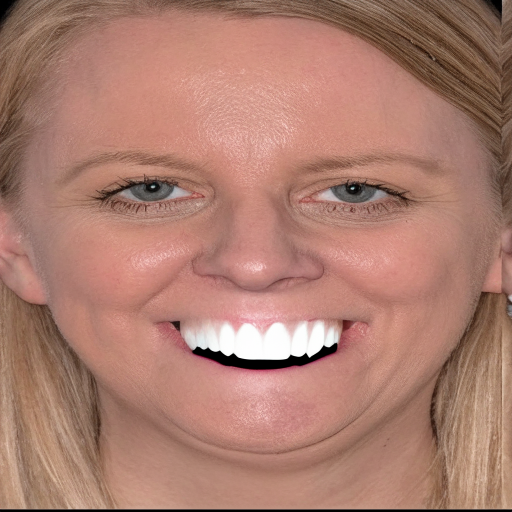

In [ ]:
import torch
from diffusers import AutoPipelineForImage2Image
from diffusers.utils import make_image_grid, load_image
from diffusers import AutoPipelineForInpainting

pipeline = AutoPipelineForInpainting.from_pretrained(
    "kandinsky-community/kandinsky-2-2-decoder-inpaint", torch_dtype=torch.float16
)
pipeline.enable_model_cpu_offload()


init_image = load_image('/content/before98.jpg')
mask_image = load_image('/content/mask98.jpg')

prompt="Whiteing teeths"
neg="[unrealistic],cartoonic,unreal,smooth skin,[deformed teeths],bad smile,missing teeths,visible gums,rest changes"

prompt_strength=0.3
gs_scale=3
generator = torch.Generator("cuda").manual_seed(92)
image = pipeline(prompt=prompt, image=init_image, mask_image=mask_image).images[0]

# make_image_grid([init_image, image], rows=1, cols=2)
image

# T16

  0%|          | 0/8 [00:00<?, ?it/s]

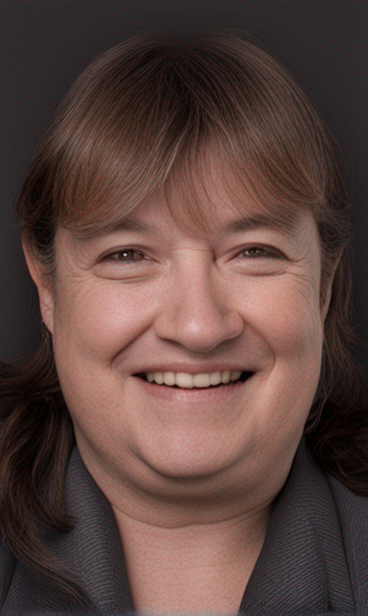

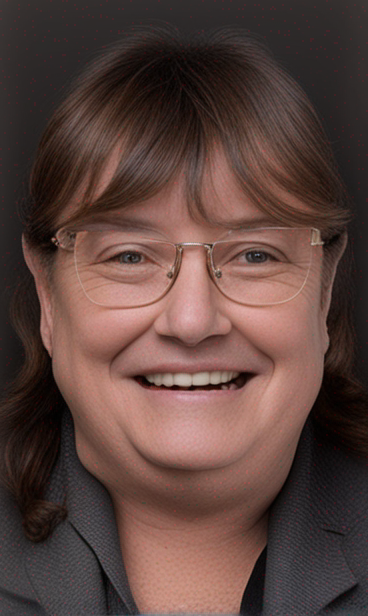

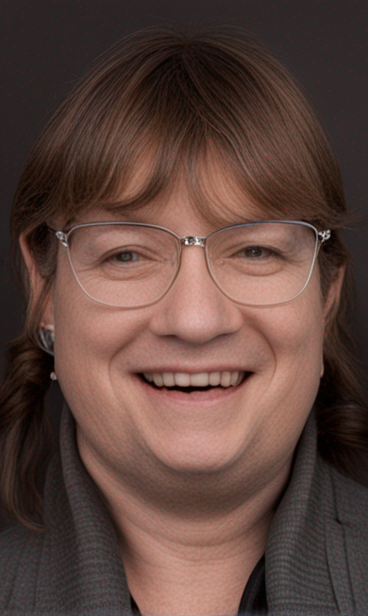

In [ ]:
init_image = load_image('/content/before111.jpg')

prompt="Person having a good face structure,no visible teeth gaps ,no missing teeths,white teeths,natural face,human face,realistic,sharp focus"
neg="[unrealistic],cartoonic,unreal,smooth skin,[deformed teeths],bad smile,missing teeths,visible gums"

prompt_strength=0.4
gs_scale=7
num_images=3

steps=20
image = pipeline(prompt,negative_prompt=neg,image=init_image,  num_inference_steps=steps,strength=prompt_strength,guidance_scale=gs_scale,num_images_per_prompt=num_images).images

# print(type(image))
# make_image_grid([init_image, image], rows=1, cols=2)

for i in range(num_images):
  display(image[i])

# T17

  0%|          | 0/4 [00:00<?, ?it/s]

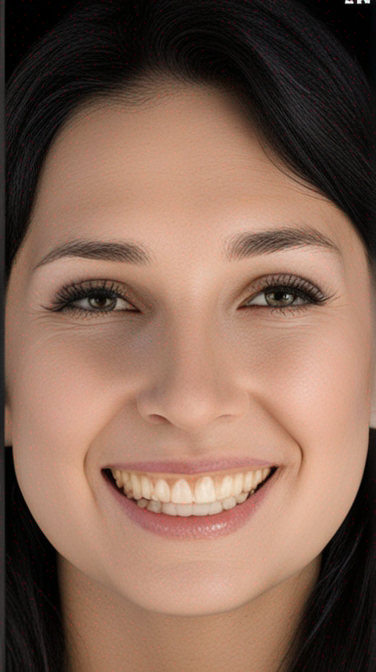

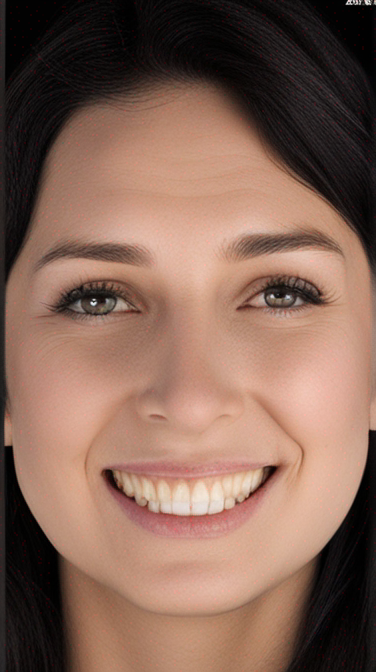

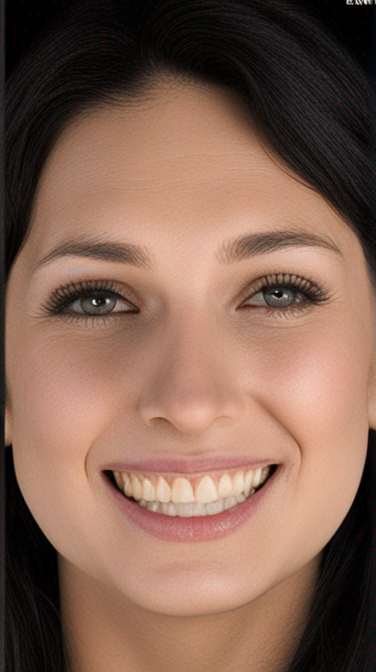

In [ ]:
init_image = load_image('/content/before140.jpg')

prompt="Person having a good face structure,no visible teeth gaps ,no missing teeths,white teeths,natural face,human face,realistic,sharp focus"
neg="[unrealistic],cartoonic,unreal,smooth skin,[deformed teeths],bad smile,missing teeths,visible gums"

prompt_strength=0.2
gs_scale=7
num_images=3

steps=20
image = pipeline(prompt,negative_prompt=neg,image=init_image,  num_inference_steps=steps,strength=prompt_strength,guidance_scale=gs_scale,num_images_per_prompt=num_images).images

# print(type(image))
# make_image_grid([init_image, image], rows=1, cols=2)

for i in range(num_images):
  display(image[i])

In [ ]:
# to clear system and GPU RAM

for i in range(500):
  %reset -f
  import gc
  import torch
  torch.cuda.empty_cache()
  gc.collect()


# T18

In [12]:
paths="/content/"
global paths

In [8]:

prompt_strength=0.2
gs_scale=7
num_images=1
steps=20


def get_completion(image,prompt_strength,gs_scale,steps,num_images):
  init_image=image
  prompt="Person having a good face structure,no visible teeth gaps ,no missing teeths,white teeths,natural face,human face,realistic,sharp focus"
  neg="[unrealistic],cartoonic,unreal,smooth skin,[deformed teeths],bad smile,missing teeths,visible gums"
  images=pipeline(prompt,negative_prompt=neg,image=init_image,num_inference_steps=steps,strength=prompt_strength,guidance_scale=gs_scale,num_images_per_prompt=num_images).images
  for i in range(num_images):
    paths="/content/"
    filepath=f"{now.date()}_{now.hour}_{now.minute}_{i}.png"
    images[i].save(os.path.join("/content/", filepath))
    paths=paths+filepath
  return images[0],paths


In [9]:
genai_app = gr.Interface(fn=get_completion,

                         inputs=[
                            gr.Image(
                                      label="Your image",type="pil"
                                    ),
                            gr.Slider(
                                    label="Prompt Strength",
                                    maximum=0.9,
                                    value=0.2,
                                    step=0.05
                            ),
                            gr.Slider(
                                    label="Guidance Scale",
                                    maximum=9,
                                    value=6,
                                    step=0.5
                            ),
                            gr.Slider(
                                    label="Inference Steps",
                                    maximum=50,
                                    value=20,
                                    step=1
                            ),
                            gr.Slider(
                                    label="Number of Images",
                                    maximum=4,
                                    value=1,
                                    step=1
                            )
                            ],
                         outputs=[
                                  gr.Image(label="Result",height=677,width=380),
                                  gr.File(label='Download File')
                                ],
                         title="SmileSculpt : Sculpting Smiles Digitally",
                         description="Generate your new smile!",
                         allow_flagging="never")

In [10]:
genai_app.launch()

Setting queue=True in a Colab notebook requires sharing enabled. Setting `share=True` (you can turn this off by setting `share=False` in `launch()` explicitly).

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
Running on public URL: https://75f0edf91a7a614e53.gradio.live

This share link expires in 72 hours. For free permanent hosting and GPU upgrades, run `gradio deploy` from Terminal to deploy to Spaces (https://huggingface.co/spaces)


  0%|          | 0/4 [00:00<?, ?it/s]

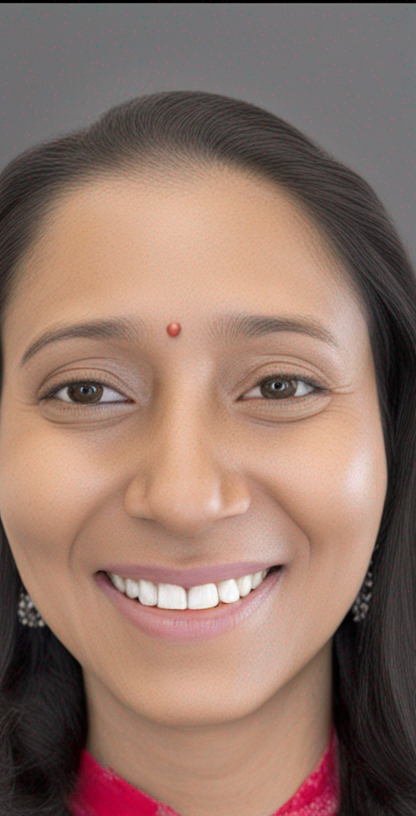

In [ ]:
init_image = load_image('/content/indian_face_4_before.png')

prompt="Person having a good face structure,no visible teeth gaps ,no missing teeths,white teeths,natural face,human face,realistic,sharp focus"
neg="[unrealistic],cartoonic,unreal,smooth skin,[deformed teeths],bad smile,missing teeths,visible gums"

prompt_strength=0.2
gs_scale=7
num_images=1

steps=20
image = pipeline(prompt,negative_prompt=neg,image=init_image,  num_inference_steps=steps,strength=prompt_strength,guidance_scale=gs_scale,num_images_per_prompt=num_images).images

# print(type(image))
# make_image_grid([init_image, image], rows=1, cols=2)

for i in range(num_images):
  filepath=f"{now.date()}_{now.hour}_{now.minute}_{i}.png"
  image[i].save(os.path.join("/content/", filepath))
  display(image[i])